# COSAS Dataset exploration 

## Load images

Device: cuda
[split]      3d-1000: train=  48 | val=  12
[split]    kfbio-400: train=  48 | val=  12
[split] teksqray-600p: train=  48 | val=  12
[totals] train=144 | val=36 | test=90
Lens: 144 36 90
[FG] b99fff65370d.png  → 1446529 positive pixels
[FG] d068d9b679a9.png  → 1457595 positive pixels
[FG] 85871ab65d9b.png  → 1595960 positive pixels
[FG] 73f40c45109e.png  → 846847 positive pixels
[FG] b59dbec94b90.png  → 2285545 positive pixels
[audit] FG in first 64 samples: 5
[Sanity] batch: torch.Size([1, 3, 1512, 1512]) torch.Size([1, 1, 1512, 1512]) | names: ['c110e2e6b88d.png']
Mask uniques: tensor([0.])


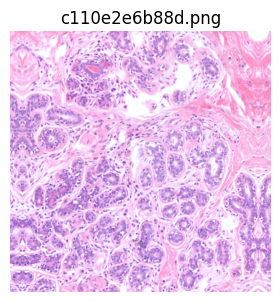

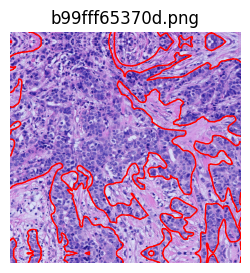

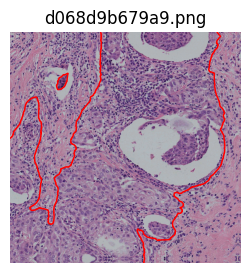

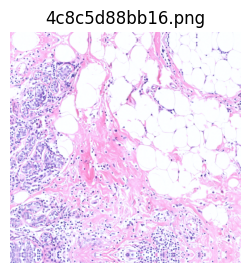

In [ ]:
import os, math, json, random, warnings
from pathlib import Path
import numpy as np, cv2, torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import timm
warnings.filterwarnings("ignore", category=UserWarning)

os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True
amp_dtype = torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)

DATA_ROOT = Path("/home/maria/stain_agnostic_nuclei/cosas24")   # has trainingtask2/ & final_test/
SAVE_DIR  = Path("/home/maria/stain_agnostic_nuclei/1512cosineschedule/NEWDATAhuge_jump"); SAVE_DIR.mkdir(parents=True, exist_ok=True)
CKPT_UNI2H = Path("/home/maria/stain_agnostic_nuclei/thunder_data/pretrained_ckpts/uni2h/pytorch_model.bin")


PHYS_BS       = 1
VAL_BS        = 1
IMG_SIZE      = 1512
WORKERS       = 4

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

def _list_images(d: Path):
    exts = (".png",".jpg",".jpeg",".tif",".tiff")
    return sorted([p for p in d.glob("*") if p.suffix.lower() in exts])

def _match_mask(msk_dir: Path, stem: str):
    exts = (".png",".jpg",".jpeg",".tif",".tiff")
    variants = [stem, f"{stem}_mask", f"{stem}_label", f"{stem}-mask", f"{stem}-label", f"{stem}_gt", f"{stem}-gt"]
    for v in variants:
        for ext in exts:
            p = msk_dir / f"{v}{ext}"
            if p.exists():
                return p
    for ext in exts:
        hits = list(msk_dir.glob(f"{stem}*{ext}"))
        if hits:
            return hits[0]
    return None

def collect_pairs(root: Path):
    """
    root/
      trainingtask2/{domain}/image,mask
      final_test/{domain}/image,mask
    Returns list of dicts: {"img": Path, "mask": Path, "name": str, "dom": str}
    """
    items_train, items_test = [], []
    # training
    tr_root = root / "trainingtask2"
    for dom_dir in sorted([d for d in tr_root.iterdir() if d.is_dir()]):
        img_dir, msk_dir = dom_dir / "image", dom_dir / "mask"
        if not (img_dir.exists() and msk_dir.exists()): 
            continue
        for ip in _list_images(img_dir):
            mp = _match_mask(msk_dir, ip.stem)
            if mp is None: 
                continue
            items_train.append({"img": ip, "mask": mp, "name": ip.name, "dom": dom_dir.name})
    # test
    te_root = root / "final_test"
    for dom_dir in sorted([d for d in te_root.iterdir() if d.is_dir()]):
        img_dir, msk_dir = dom_dir / "image", dom_dir / "mask"
        if not (img_dir.exists() and msk_dir.exists()): 
            continue
        for ip in _list_images(img_dir):
            mp = _match_mask(msk_dir, ip.stem)
            if mp is None: 
                continue
            items_test.append({"img": ip, "mask": mp, "name": ip.name, "dom": dom_dir.name})
    return items_train, items_test

def split_80_20_by_domain(items, val_ratio=0.2, seed=42):
    rng = random.Random(seed)
    by_dom = {}
    for it in items: 
        by_dom.setdefault(it["dom"], []).append(it)
    train, val = [], []
    for dom, L in by_dom.items():
        rng.shuffle(L)
        n_val = max(1, int(round(val_ratio * len(L))))
        val += L[:n_val]; train += L[n_val:]
        print(f"[split] {dom:>12s}: train={len(L)-n_val:4d} | val={n_val:4d}")
    rng.shuffle(train); rng.shuffle(val)
    return train, val

class COSASFolder(Dataset):
    def __init__(self, items, tf):
        self.items = items; self.tf = tf
    def __len__(self): return len(self.items)

    def _load_rgb(self, p: Path):
        im = cv2.imread(str(p))
        if im is None: raise FileNotFoundError(p)
        return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

    def _load_mask(self, p: Path):
        m = cv2.imread(str(p), cv2.IMREAD_GRAYSCALE)
        if m is None: return None
        return (m > 0).astype(np.uint8)

    def __getitem__(self, idx):
        rec = self.items[idx]
        img = self._load_rgb(rec["img"])
        msk = self._load_mask(rec["mask"])
        if msk is None:
            msk = np.zeros(img.shape[:2], np.uint8)

        data = self.tf(image=img, mask=msk)
        x = data["image"]; y = data["mask"].float().unsqueeze(0)
        return x, y, rec["name"]

# ==== augs ====
try:
    SharpenLike = A.Sharpen
    sharpen_kwargs = dict(alpha=(0.05, 0.15), lightness=(0.9, 1.1))
except AttributeError:
    SharpenLike = A.UnsharpMask
    sharpen_kwargs = dict(blur_limit=(3,5), alpha=(0.1, 0.2))

import cv2
import albumentations as A

def _pad_to(img, H, W, mode, value=0):
    h, w = img.shape[:2]
    dh, dw = max(0, H-h), max(0, W-w)
    if dh == 0 and dw == 0: return img
    t, b = dh // 2, dh - dh // 2
    l, r = dw // 2, dw - dw // 2
    return cv2.copyMakeBorder(img, t, b, l, r, mode, value=value)

class PadToSizeReflectZero(A.DualTransform):
    """Pad to (H,W): image uses REFLECT_101, mask uses CONSTANT=0."""
    def __init__(self, height, width, p=1.0):
        super().__init__(p=p); self.H = int(height); self.W = int(width)
    def apply(self, img, **params):
        return _pad_to(img, self.H, self.W, cv2.BORDER_REFLECT_101)
    def apply_to_mask(self, mask, **params):
        return _pad_to(mask, self.H, self.W, cv2.BORDER_CONSTANT, value=0)
    @property
    def targets_as_params(self): return []
    def get_transform_init_args_names(self): return ("height","width")


try:
    SharpenLike = A.Sharpen
    sharpen_kwargs = dict(alpha=(0.05, 0.12), lightness=(0.95, 1.05))
except AttributeError:
    SharpenLike = A.UnsharpMask
    sharpen_kwargs = dict(blur_limit=(3,5), alpha=(0.08, 0.15))

tf_train = A.Compose([
    A.HorizontalFlip(p=0.5), A.VerticalFlip(p=0.5), A.RandomRotate90(p=0.5),

    A.ShiftScaleRotate(shift_limit=0.03, scale_limit=0.08, rotate_limit=12,
                       border_mode=cv2.BORDER_REFLECT_101, value=None, mask_value=0, p=0.5),
    A.ElasticTransform(alpha=10, sigma=4, alpha_affine=4,
                       border_mode=cv2.BORDER_REFLECT_101, value=None, mask_value=0, p=0.08),

    A.LongestMaxSize(max_size=IMG_SIZE, interpolation=cv2.INTER_LINEAR),
    A.PadIfNeeded(IMG_SIZE, IMG_SIZE, border_mode=cv2.BORDER_REFLECT_101, value=None, mask_value=0),

    A.CropNonEmptyMaskIfExists(IMG_SIZE, IMG_SIZE, p=0.70),
    A.RandomCrop(IMG_SIZE, IMG_SIZE, p=0.30),

    A.RandomBrightnessContrast(0.12, 0.12, p=0.6),
    A.HueSaturationValue(hue_shift_limit=6, sat_shift_limit=14, val_shift_limit=10, p=0.4),
    A.RGBShift(r_shift_limit=6, g_shift_limit=6, b_shift_limit=6, p=0.2),
    A.ImageCompression(quality_lower=60, quality_upper=95, p=0.10),
    A.GaussNoise(var_limit=(3.0,10.0), p=0.10),

    SharpenLike(p=0.10, **sharpen_kwargs),

    A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
    ToTensorV2(),
])

tf_val = A.Compose([
    A.LongestMaxSize(max_size=IMG_SIZE, interpolation=cv2.INTER_LINEAR),
    A.PadIfNeeded(IMG_SIZE, IMG_SIZE, border_mode=cv2.BORDER_REFLECT_101, value=None, mask_value=0),
    A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
    ToTensorV2(),
])



tf_eval_native = A.Compose([
    A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)), ToTensorV2()
])

# ==== build lists & split ====
items_train_all, items_test = collect_pairs(DATA_ROOT)
items_train, items_val = split_80_20_by_domain(items_train_all, val_ratio=0.20, seed=SEED)
print(f"[totals] train={len(items_train)} | val={len(items_val)} | test={len(items_test)}")

#  upweight batches that contain FG pixels
def _mask_has_fg(p: Path) -> bool:
    m = cv2.imread(str(p), cv2.IMREAD_GRAYSCALE)
    return bool(m is not None and (m > 0).any())

def build_train_sampler(items):
    weights = [3.0 if _mask_has_fg(r["mask"]) else 1.0 for r in items]  # tweak 2–5x if needed
    return WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)


train_ds = COSASFolder(items_train, tf_train)
val_ds   = COSASFolder(items_val,   tf_val)
test_ds  = COSASFolder(items_test,  tf_val)

train_ld = DataLoader(train_ds, batch_size=PHYS_BS, shuffle=True,
                      num_workers=WORKERS, pin_memory=True,
                      persistent_workers=True, prefetch_factor=4, drop_last=True)


val_ld = DataLoader(val_ds, batch_size=VAL_BS, shuffle=False,
                    num_workers=WORKERS, pin_memory=True,
                    persistent_workers=True, prefetch_factor=2, drop_last=False)

test_ld = DataLoader(test_ds, batch_size=VAL_BS, shuffle=False,
                     num_workers=WORKERS, pin_memory=True,
                     persistent_workers=True, prefetch_factor=2, drop_last=False)

# native-scale eval loaders 
val_native_ld  = DataLoader(COSASFolder(items_val,  tf_eval_native),  batch_size=1, shuffle=False, num_workers=WORKERS, pin_memory=True)
test_native_ld = DataLoader(COSASFolder(items_test, tf_eval_native), batch_size=1, shuffle=False, num_workers=WORKERS, pin_memory=True)

print("Lens:", len(train_ds), len(val_ds), len(test_ds))

# ---- ensure we have FG samples ----
fg_seen = 0
for i in range(min(64, len(train_ds))):
    _, y, n = train_ds[i]
    if y.sum() > 0:
        print(f"[FG] {n}  → {int(y.sum().item())} positive pixels")
        fg_seen += 1
        if fg_seen >= 5: break
print(f"[audit] FG in first {min(64,len(train_ds))} samples: {fg_seen}")


try:
    xb, yb, names = next(iter(train_ld))
    print("[Sanity] batch:", xb.shape, yb.shape, "| names:", list(names[:4]))
    print("Mask uniques:", torch.unique(yb))
    imgs = (xb[:3].cpu().permute(0,2,3,1).numpy()*0.229 + 0.485)
    imgs = np.clip(imgs, 0, 1)
    fig = plt.figure(figsize=(9,3))
    for i in range(min(3, xb.size(0))):
        plt.subplot(1,3,i+1); plt.title(names[i]); plt.imshow(imgs[i]); 
        plt.contour(yb[i,0].cpu().numpy(), levels=[0.5], linewidths=1, colors='r')
        plt.axis('off')
    plt.tight_layout(); plt.show()
except Exception as e:
    print("[Sanity] Failed to fetch a batch:", e)

for i in range(3):
    xb, yb, n = train_ds[i]
    plt.figure(figsize=(3,3)); plt.title(n)
    img = (xb.permute(1,2,0).numpy()*0.229 + 0.485).clip(0,1)
    plt.imshow(img); plt.contour(yb[0].numpy(), levels=[0.5], colors='r', linewidths=1); plt.axis('off'); plt.show()

## Domain and dataset summary

In [9]:
from collections import Counter
import pandas as pd

# Count by domain and split
domains_train = [x["dom"] for x in items_train]
domains_val = [x["dom"] for x in items_val]
domains_test = [x["dom"] for x in items_test]

print("Train per domain:", Counter(domains_train))
print("Val per domain:", Counter(domains_val))
print("Test per domain:", Counter(domains_test))

# Build dataframe for easier analysis
df = pd.DataFrame(items_train_all)
df["split"] = ["train" if x in items_train else "val" for x in items_train_all]
display(df.head())




Train per domain: Counter({'kfbio-400': 48, 'teksqray-600p': 48, '3d-1000': 48})
Val per domain: Counter({'kfbio-400': 12, '3d-1000': 12, 'teksqray-600p': 12})
Test per domain: Counter({'3d-1000': 15, '3d-250': 15, 'kfbio-400': 15, 'leica-450': 15, 'motic': 15, 'teksqray-600p': 15})


,img,mask,name,dom,split
0,/home/maria/stain_agnostic_nuclei/cosas24/trai...,/home/maria/stain_agnostic_nuclei/cosas24/trai...,00cee036e73c.png,3d-1000,train
1,/home/maria/stain_agnostic_nuclei/cosas24/trai...,/home/maria/stain_agnostic_nuclei/cosas24/trai...,01529ba352bd.png,3d-1000,train
2,/home/maria/stain_agnostic_nuclei/cosas24/trai...,/home/maria/stain_agnostic_nuclei/cosas24/trai...,05ff1626a341.png,3d-1000,train
3,/home/maria/stain_agnostic_nuclei/cosas24/trai...,/home/maria/stain_agnostic_nuclei/cosas24/trai...,094d99419f9b.png,3d-1000,train
4,/home/maria/stain_agnostic_nuclei/cosas24/trai...,/home/maria/stain_agnostic_nuclei/cosas24/trai...,0ce9d08f22a4.png,3d-1000,train


## Training set

### Foreground (tumor) pixel statistics per scanner

Foreground ratio:   0%|          | 0/180 [00:00<?, ?it/s]

               count      mean       std  min       25%       50%       75%  \
dom                                                                           
3d-1000         60.0  0.532137  0.270865  0.0  0.357086  0.527388  0.739965   
kfbio-400       60.0  0.521806  0.309645  0.0  0.263421  0.540657  0.770852   
teksqray-600p   60.0  0.483567  0.289980  0.0  0.279100  0.453505  0.683880   

               max  
dom                 
3d-1000        1.0  
kfbio-400      1.0  
teksqray-600p  1.0  


<Figure size 800x400 with 0 Axes>

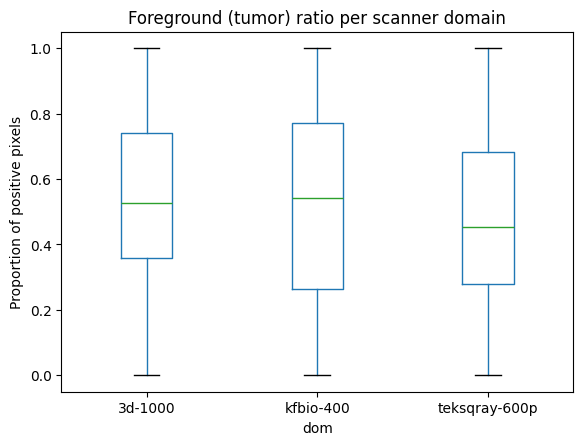

In [3]:
def mask_foreground_ratio(mask_path):
    m = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    if m is None: return np.nan
    return (m > 0).mean()

ratios = []
for rec in tqdm(items_train_all, desc="Foreground ratio"):
    ratios.append({"dom": rec["dom"], "ratio": mask_foreground_ratio(rec["mask"])})
ratios_df = pd.DataFrame(ratios)
print(ratios_df.groupby("dom")["ratio"].describe())

# Visualize per domain
plt.figure(figsize=(8,4))
ratios_df.boxplot(column="ratio", by="dom", grid=False)
plt.suptitle(""); plt.title("Foreground (tumor) ratio per scanner domain")
plt.ylabel("Proportion of positive pixels"); plt.show()


### Color distribution and stain variation across scanners

Color stats:   0%|          | 0/180 [00:00<?, ?it/s]

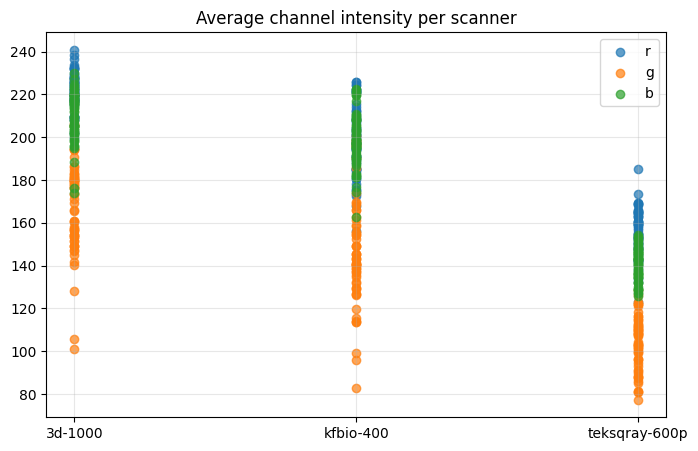

In [4]:
color_stats = []
for rec in tqdm(items_train_all, desc="Color stats"):
    img = cv2.imread(str(rec["img"]))[:,:,::-1]  # RGB
    mean = img.reshape(-1,3).mean(axis=0)
    std = img.reshape(-1,3).std(axis=0)
    color_stats.append({"dom": rec["dom"], "r_mean": mean[0], "g_mean": mean[1], "b_mean": mean[2]})
color_df = pd.DataFrame(color_stats)

plt.figure(figsize=(8,5))
for c, col in zip(["r_mean","g_mean","b_mean"], ['r','g','b']):
    plt.scatter(color_df["dom"], color_df[c], label=col, alpha=0.7)
plt.title("Average channel intensity per scanner")
plt.legend(); plt.grid(True, alpha=0.3); plt.show()


### Image resolution and mask area sanity check

In [5]:
dims = []
for rec in tqdm(items_train_all):
    im = cv2.imread(str(rec["img"]))
    h, w = im.shape[:2]
    dims.append({"dom": rec["dom"], "h": h, "w": w, "aspect": w/h})
dims_df = pd.DataFrame(dims)
print(dims_df.groupby("dom")[["h","w","aspect"]].describe())


  0%|          | 0/180 [00:00<?, ?it/s]

                  h                                                            \
              count         mean        std     min      25%     50%      75%   
dom                                                                             
3d-1000        60.0  1396.433333  56.240816  1300.0  1356.75  1390.5  1448.00   
kfbio-400      60.0  1399.950000  56.247463  1300.0  1353.75  1392.5  1452.25   
teksqray-600p  60.0  1416.033333  63.054985  1307.0  1347.50  1432.5  1467.75   

                          w           ...                  aspect            \
                  max count     mean  ...      75%     max  count      mean   
dom                                   ...                                     
3d-1000        1491.0  60.0  1403.95  ...  1450.50  1497.0   60.0  1.007018   
kfbio-400      1493.0  60.0  1384.40  ...  1429.25  1500.0   60.0  0.990645   
teksqray-600p  1499.0  60.0  1393.65  ...  1445.00  1497.0   60.0  0.986133   

                                      

### Visual gallery per domain

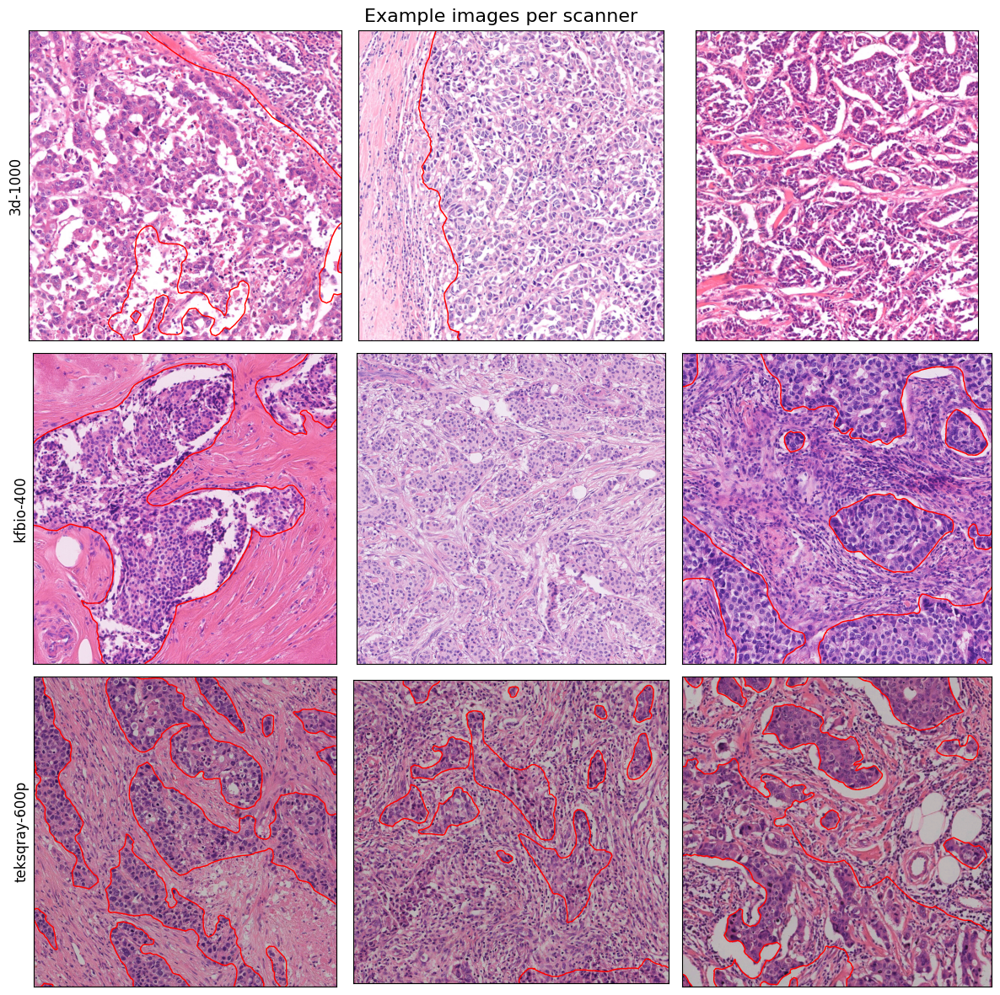

In [6]:
def show_examples_per_domain(items, n=3):
    domains = sorted(set([it["dom"] for it in items]))
    fig, axes = plt.subplots(len(domains), n, figsize=(4*n, 4*len(domains)))
    for i, dom in enumerate(domains):
        subset = [x for x in items if x["dom"] == dom][:n]
        for j, rec in enumerate(subset):
            img = cv2.cvtColor(cv2.imread(str(rec["img"])), cv2.COLOR_BGR2RGB)
            mask = cv2.imread(str(rec["mask"]), cv2.IMREAD_GRAYSCALE)
            ax = axes[i, j] if len(domains) > 1 else axes[j]
            ax.imshow(img)
            ax.contour(mask, levels=[0.5], colors='r', linewidths=1)
            if j == 0:
                ax.set_ylabel(dom, fontsize=12)
            ax.set_xticks([]); ax.set_yticks([])
    plt.suptitle("Example images per scanner", fontsize=16)
    plt.tight_layout(); plt.show()

show_examples_per_domain(items_train_all, n=3)


## Test set analysis

### Foreground ratio per test scanner

Test FG ratio:   0%|          | 0/90 [00:00<?, ?it/s]

               count      mean       std  min       25%       50%       75%  \
dom                                                                           
3d-1000         15.0  0.500307  0.260637  0.0  0.383848  0.441377  0.640242   
3d-250          15.0  0.582846  0.290137  0.0  0.386322  0.680597  0.781722   
kfbio-400       15.0  0.346983  0.248176  0.0  0.145043  0.283758  0.531382   
leica-450       15.0  0.402815  0.182886  0.0  0.332016  0.431308  0.497639   
motic           15.0  0.328060  0.209041  0.0  0.222125  0.254143  0.441786   
teksqray-600p   15.0  0.337258  0.164452  0.0  0.236821  0.362015  0.414334   

                    max  
dom                      
3d-1000        0.944769  
3d-250         0.926319  
kfbio-400      0.799191  
leica-450      0.684784  
motic          0.760844  
teksqray-600p  0.608389  


<Figure size 800x400 with 0 Axes>

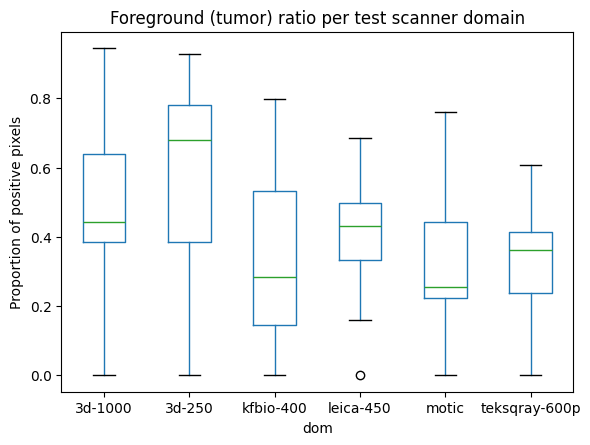

In [10]:
ratios_test = []
for rec in tqdm(items_test, desc="Test FG ratio"):
    m = cv2.imread(str(rec["mask"]), cv2.IMREAD_GRAYSCALE)
    if m is None:
        continue
    ratios_test.append({"dom": rec["dom"], "ratio": (m > 0).mean()})
ratios_test_df = pd.DataFrame(ratios_test)

print(ratios_test_df.groupby("dom")["ratio"].describe())

plt.figure(figsize=(8,4))
ratios_test_df.boxplot(column="ratio", by="dom", grid=False)
plt.suptitle("")
plt.title("Foreground (tumor) ratio per test scanner domain")
plt.ylabel("Proportion of positive pixels")
plt.show()


### Color profile comparison (RGB means)

Color stats (test):   0%|          | 0/90 [00:00<?, ?it/s]

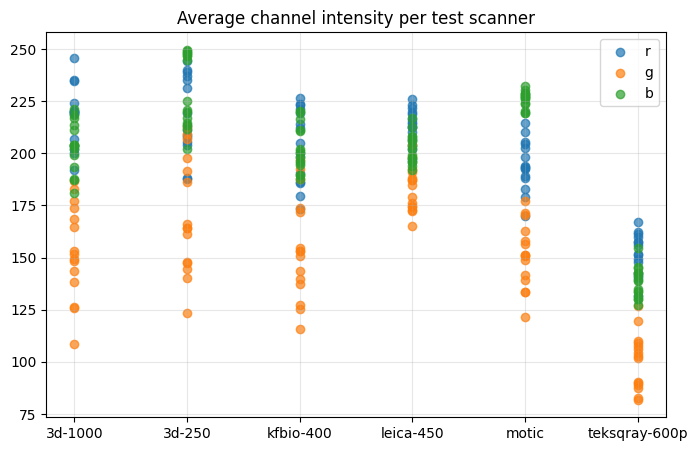

In [11]:
color_stats_test = []
for rec in tqdm(items_test, desc="Color stats (test)"):
    img = cv2.imread(str(rec["img"]))[:,:,::-1]
    mean = img.reshape(-1,3).mean(axis=0)
    std  = img.reshape(-1,3).std(axis=0)
    color_stats_test.append({"dom": rec["dom"], "r_mean": mean[0], "g_mean": mean[1], "b_mean": mean[2]})
color_df_test = pd.DataFrame(color_stats_test)

plt.figure(figsize=(8,5))
for c, col in zip(["r_mean","g_mean","b_mean"], ['r','g','b']):
    plt.scatter(color_df_test["dom"], color_df_test[c], label=col, alpha=0.7)
plt.legend(); plt.title("Average channel intensity per test scanner"); plt.grid(True, alpha=0.3)
plt.show()


### Visual sanity check of test samples

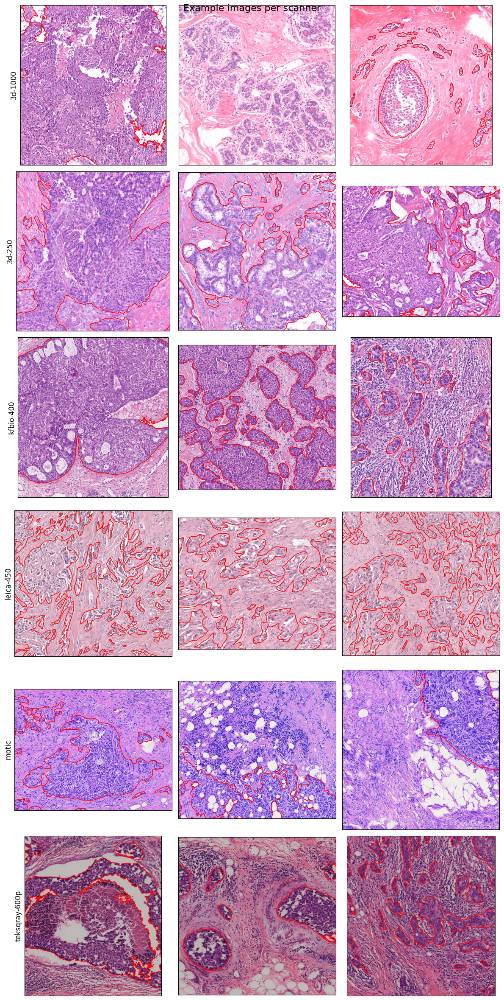

In [12]:
show_examples_per_domain(items_test, n=3)
